In [1]:
from sqlite3 import SQLITE_CREATE_VIEW
import anndata
import scanpy as sc
import os
#from bbknn import bbknn
import matplotlib.pyplot as plt
import omicverse as ov
#import scib
from scvi.model.utils import mde
#from scib_metrics.benchmark import Benchmarker
import scvi
#import scanorama
import numpy as np
#import pyliger
#from harmony import harmonize
from rich import print
import seaborn as sns
#import bbknn
#import doubletdetection
%matplotlib inline
import pandas as pd
plt.rcParams.update({'font.size': 12})


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.3, Tutorials: https://omicverse.readthedocs.io/


[rank: 0] Global seed set to 0


In [2]:
#####Change path and Load data
os.chdir("/storage/liuxiaodongLab/fanxueying/mayanalysis/2024Aug")
adata = anndata.read_h5ad("scib_human_all8.20.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 34387 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'anno', 'sub_anno', 'harmo.anno', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap'
    obsm: 'CCA', 'FastMNN', 'Harmony', 'LIGER', 'Scanorama', 'Unintegrated', 'X_CCA', 'X_FastMNN', 'X_Harmony', 'X_LIGER', 'X_Scanorama', 'X_

In [4]:
adata.obsm['X_umap']=adata.obsm['X_scANVI']

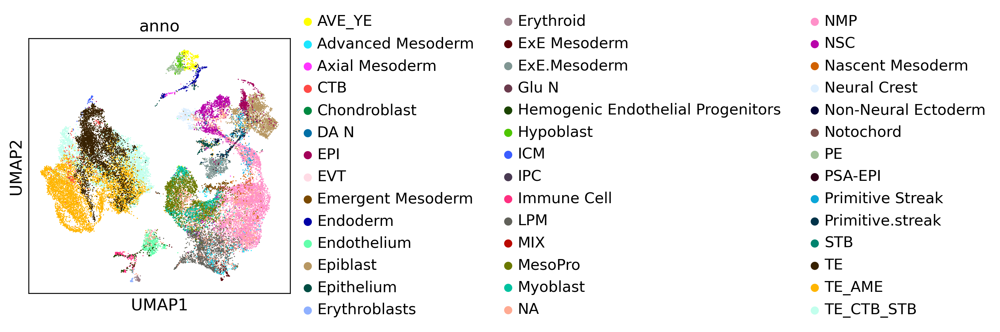

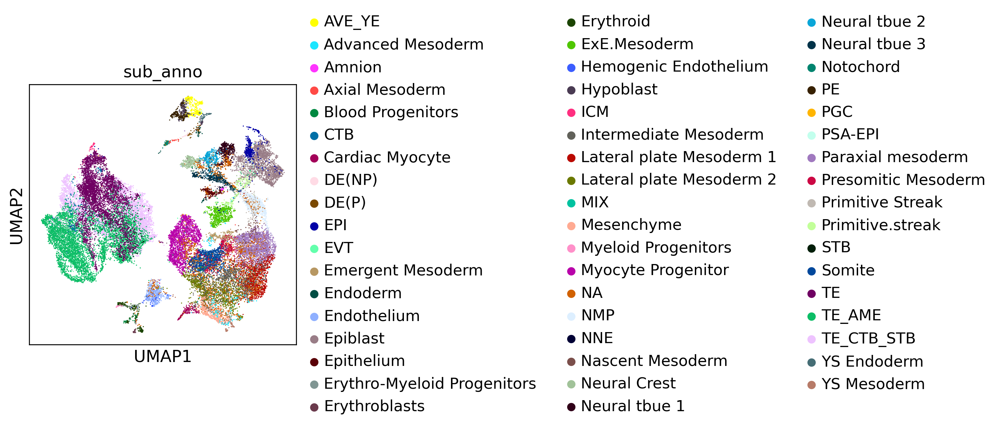

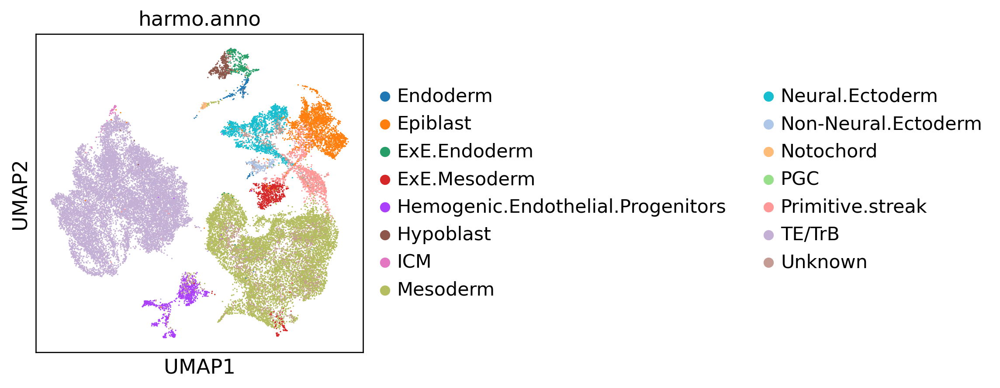

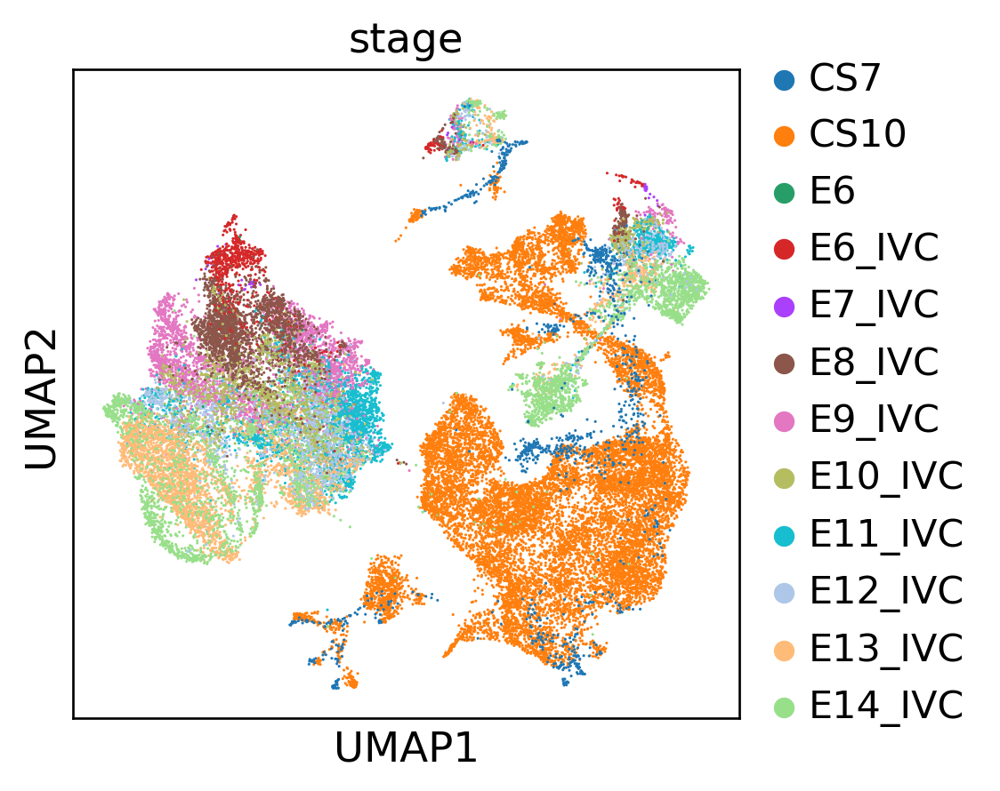

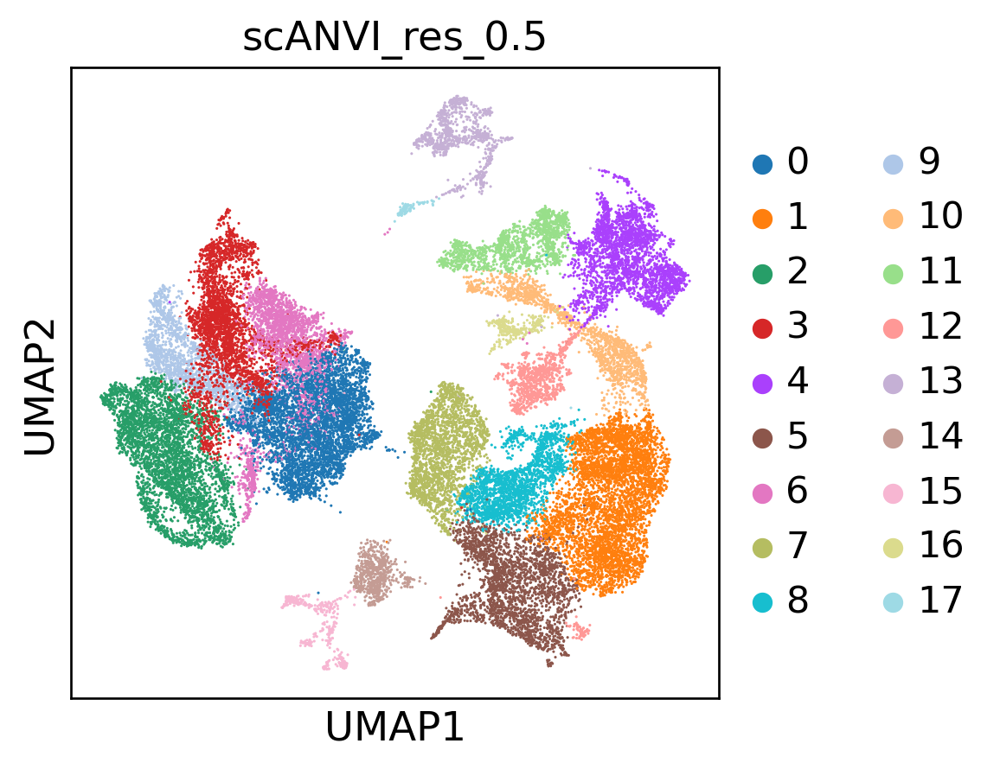

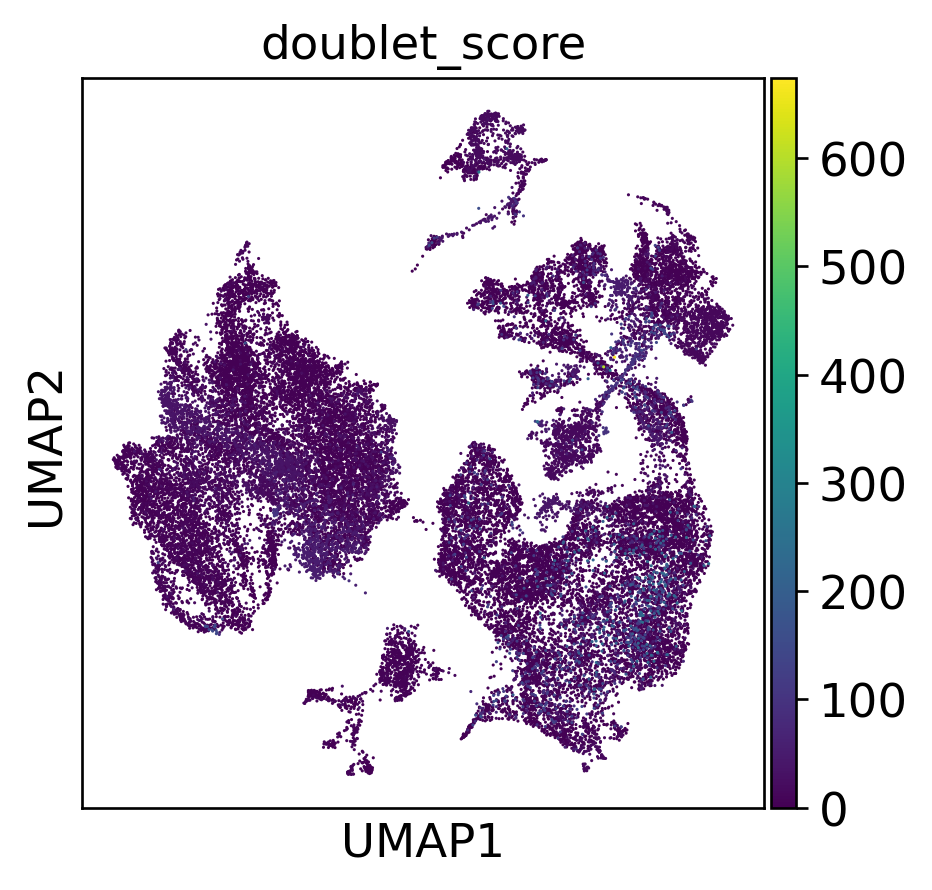

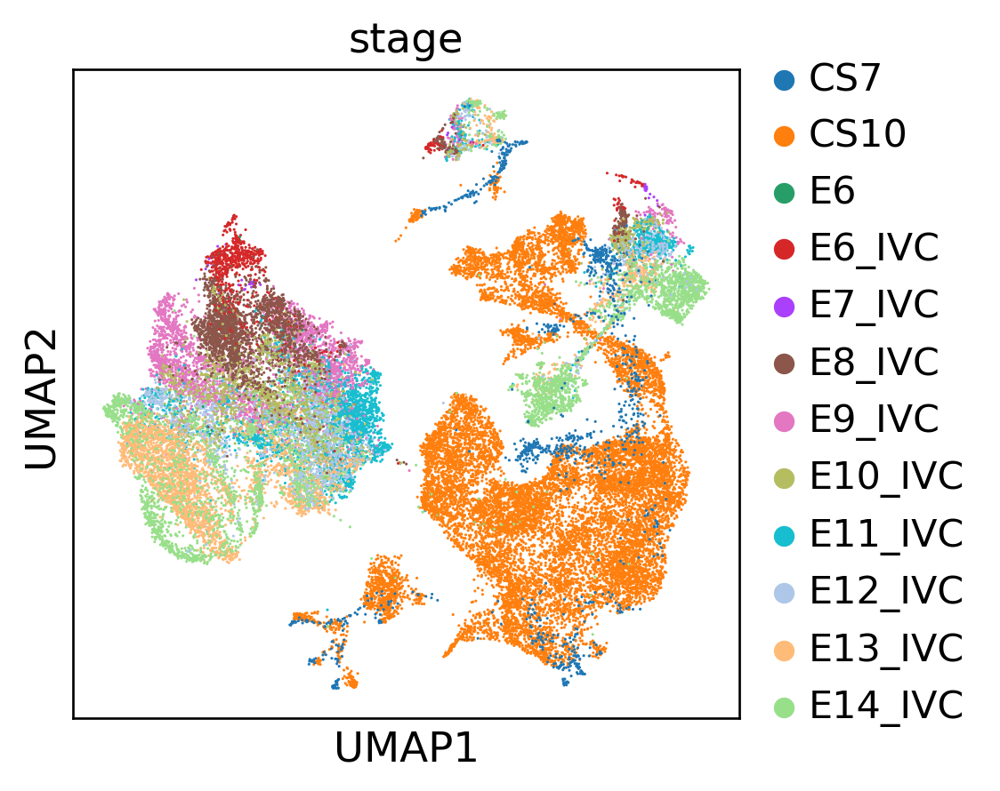

In [5]:
sc.pl.umap(adata, color=['anno'])
sc.pl.umap(adata, color=['sub_anno'])
sc.pl.umap(adata, color=['harmo.anno'])
sc.pl.umap(adata, color=['stage'])
sc.pl.umap(adata, color=['scANVI_res_0.5'])
sc.pl.umap(adata, color=['doublet_score'])
sc.pl.umap(adata, color=['stage'])

In [6]:
#rename dataset labels
# Rename 'anno' to 'level_1'
adata.obs.rename(columns={'harmo.anno': 'ann_level_1'}, inplace=True)
#adata.obs.rename(columns={'scANVI_res_0.5': 'ann_level_2'}, inplace=True)
adata.obs.rename(columns={'anno': 'ann_level_2'}, inplace=True)
adata.obs.rename(columns={'sub_anno': 'ann_level_3'}, inplace=True)

In [7]:
obs = adata.obs.copy()

In [8]:
obs

,orig.ident,nCount_RNA,nFeature_RNA,sample,stage,percent.mt,species,embryo,platform,ann_level_2,...,doublet,doublet_score,Unintegrated_res_0.5,Scanorama_res_0.5,LIGER_res_0.5,Harmony_res_0.5,scVI_res_0.5,scANVI_res_0.5,CCA_res_0.5,FastMNN_res_0.5
AAACCTGAGACGCTTT-1_1_1_1_1_1_1,mole,112028.0,9381,Sample1,E9_IVC,5.228157,Homo sapiens,Real Embryo in vitro,10x-Genomics,TE_CTB_STB,...,0.0,8.231173e+00,6,1,9,1,2,9,4,5
AACGTTGAGACGCAAC-1_1_1_1_1_1_1,mole,191885.0,8618,Sample1,E9_IVC,14.688485,Homo sapiens,Real Embryo in vitro,10x-Genomics,TE_CTB_STB,...,0.0,7.789287e+00,0,7,7,0,0,0,7,10
AACTCAGCAGACGCCT-1_1_1_1_1_1_1,mole,189565.0,7942,Sample1,E9_IVC,7.517738,Homo sapiens,Real Embryo in vitro,10x-Genomics,TE_CTB_STB,...,0.0,1.656587e+01,0,10,7,0,0,0,5,8
AAGACCTTCGGCGCTA-1_1_1_1_1_1_1,mole,25545.0,4869,Sample1,E9_IVC,17.987865,Homo sapiens,Real Embryo in vitro,10x-Genomics,TE_CTB_STB,...,0.0,1.603532e+01,0,10,7,7,2,9,5,8
AAGCCGCCATATGGTC-1_1_1_1_1_1_1,mole,107601.0,10074,Sample1,E9_IVC,3.851265,Homo sapiens,Real Embryo in vitro,10x-Genomics,Hypoblast,...,0.0,1.710273e+01,17,16,3,4,12,13,13,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAATCTGA,zhou,7297.0,2026,tri-vol-d8-181015T,E8_IVC,12.210497,Homo sapiens,Tri_hv_D8_IVC2_E7_B3_46,STRT-Seq,TE,...,0.0,1.347252e-10,1,11,1,8,0,6,9,1
GCCAAGAC,zhou,7962.0,2019,tri-vol-d8-181015T,E8_IVC,0.879176,Homo sapiens,Tri_hv_D8_IVC2_E7_B3_96,STRT-Seq,TE,...,0.0,1.347252e-10,1,11,1,8,8,6,9,1
GTCGTAGA,zhou,9702.0,2740,tri-vol-d8-181015T,E8_IVC,4.648526,Homo sapiens,Tri_hv_D8_IVC2_E7_B3_57,STRT-Seq,PE,...,0.0,1.347252e-10,1,11,1,8,8,6,9,1
TATCAGCA,zhou,10857.0,2771,tri-vol-d8-181015T,E8_IVC,3.232937,Homo sapiens,Tri_hv_D8_IVC2_E7_B3_61,STRT-Seq,TE,...,0.0,1.347252e-10,1,11,7,8,8,6,9,1


In [9]:
#nested clustering
#https://github.com/LungCellAtlas/HLCA_reproducibility/blob/main/scripts
import scanpy.external as sce
import sys
import nested_clustering
import analysis

In [10]:
number_of_clust_levels = 3
use_rep = "scANVI"
for clustering_level in range(1, number_of_clust_levels + 1):
    print("clustering level:", clustering_level, "...")
    if clustering_level == 1:
        # skip for re-run
        cluster_name = "leiden_1"
        # first clustering is not nested, so use normal function:
        sc.pp.neighbors(adata, n_neighbors=30, use_rep=use_rep)
        sc.tl.leiden(adata, resolution=0.01, key_added=cluster_name)
    else:
        previous_clustering = "leiden_" + str(clustering_level - 1)
        cluster_name = "leiden_" + str(clustering_level)
        #         perform nested clustering
        #         set parameters:
        res = 0.2
        if clustering_level == 2:
            k = 30
            min_cluster_size = 50
        elif clustering_level == 3:
            k = 15
            min_cluster_size = 30
        elif clustering_level == 4:
            k = 10
            min_cluster_size = 10

        adata = nested_clustering.add_nested_clustering_blind(
            adata,
            previous_clustering,
            cluster_name,
            use_rep=use_rep,
            cluster_alg="leiden",
            cluster_k=k,
            cluster_res=res,
            min_cluster_size=min_cluster_size,
            redo_pca=False,  # SET THIS TO FALSE FOR SCANVI!!! OR OTHER EMBEDDING-OUTPUT METHODS!!!!!
        )

clustering level: 1 ...

clustering level: 2 ...

Not re-doing pca before nested clustering iterations!
Cluster: 0
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 1
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering


clustering level: 3 ...

Not re-doing pca before nested clustering iterations!
Cluster: 0.0
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.1
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.10
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.11
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.2
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.3
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.4
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.5
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.6
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.7
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.8
reclusterin

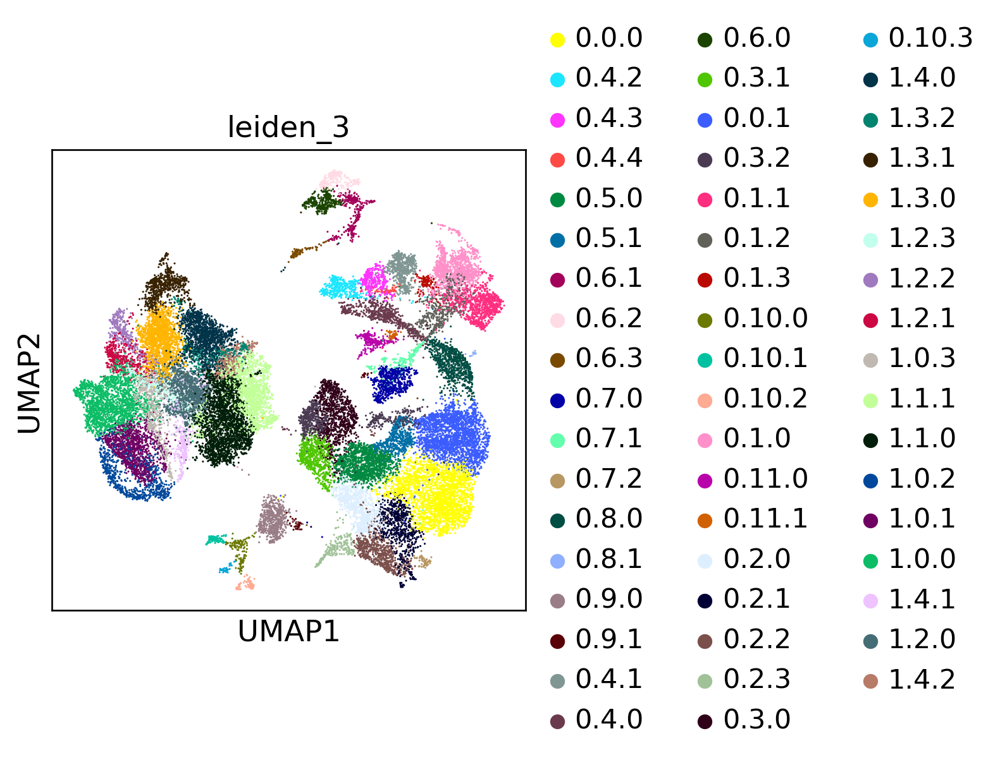

In [11]:
# plot
sc.pl.umap(adata, color=cluster_name)

In [12]:
adata

AnnData object with n_obs × n_vars = 34387 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap', 'anno_colors', 'sub_anno_colors', 'leiden_3_colors'
    obsm: 'CCA', 'FastMNN', 'Harmony', 'L

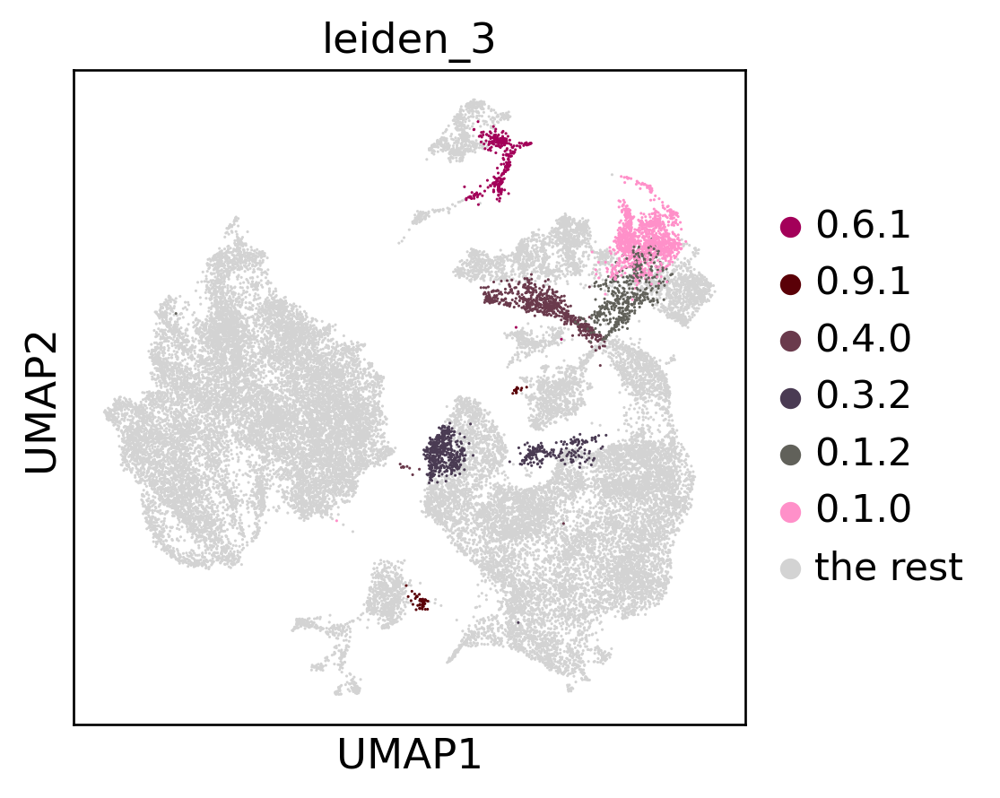

In [13]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["leiden_3"], groups=[ '0.1.0', '0.6.1','0.1.2','0.9.1','0.3.2','0.4.0'], show=False)

# Change legend text from "NA" to "other cell types"
legend_texts = ax.get_legend().get_texts()
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

In [14]:
# further subclustering specific clusters to get reported cell populations
cls_to_recluster = [
    "0.1.0", #for epi and PGC
    "0.6.1", #for DE
    "0.1.2", #for epi
    "0.9.1", #for endothelium
    "0.3.2", #for emergent mesoderm
    #"0.4.0", #for neural tube    
    
] 

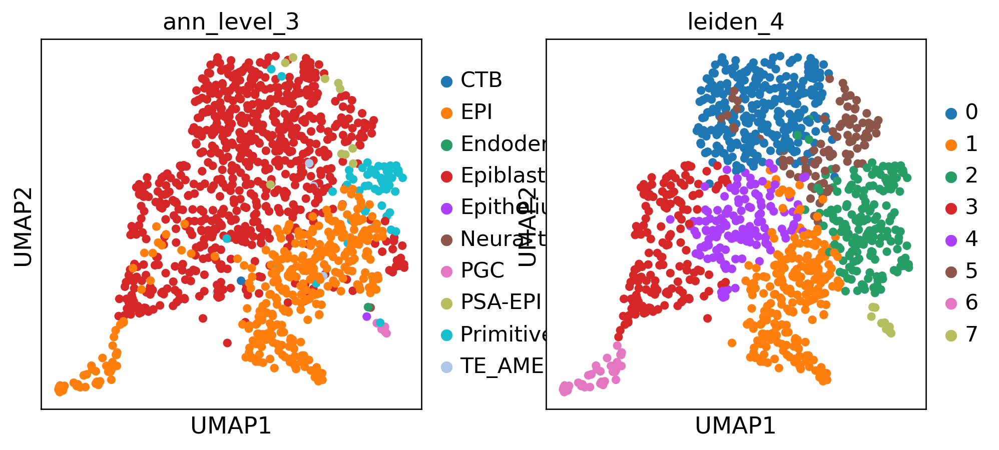

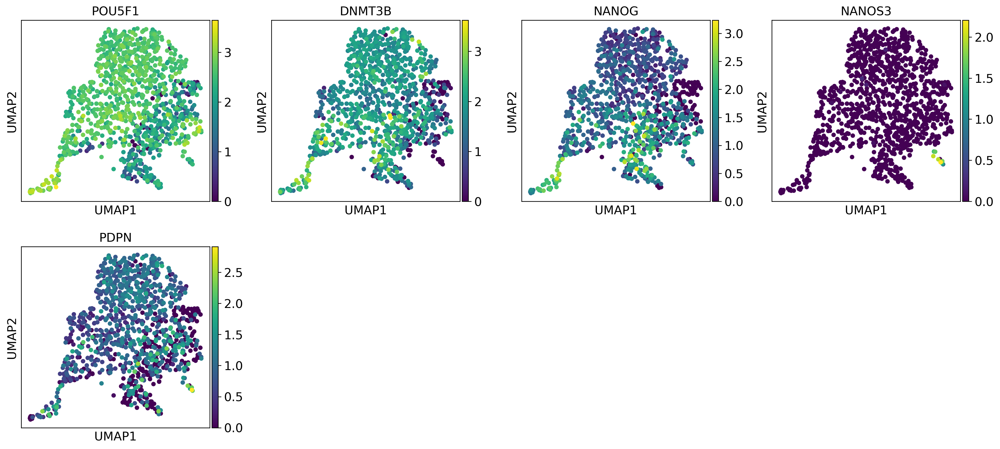

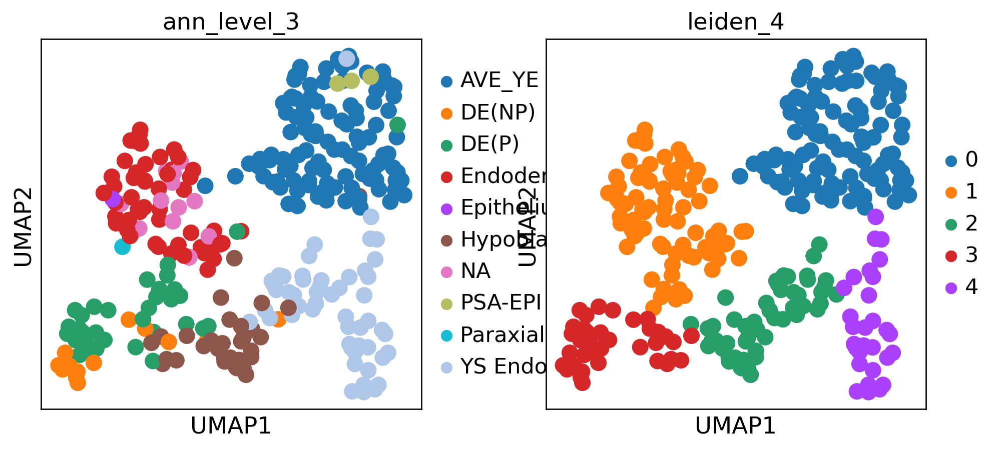

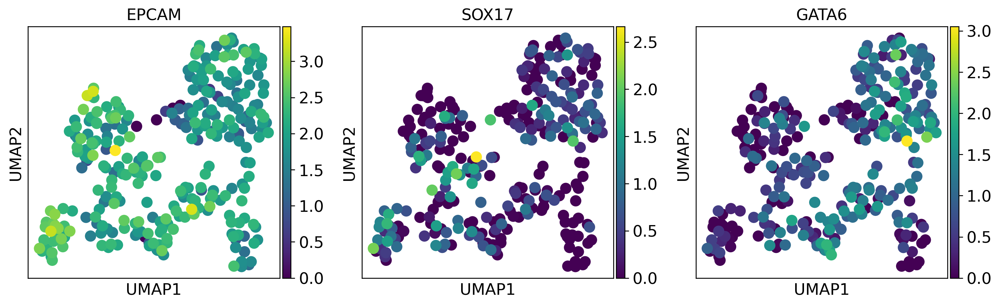

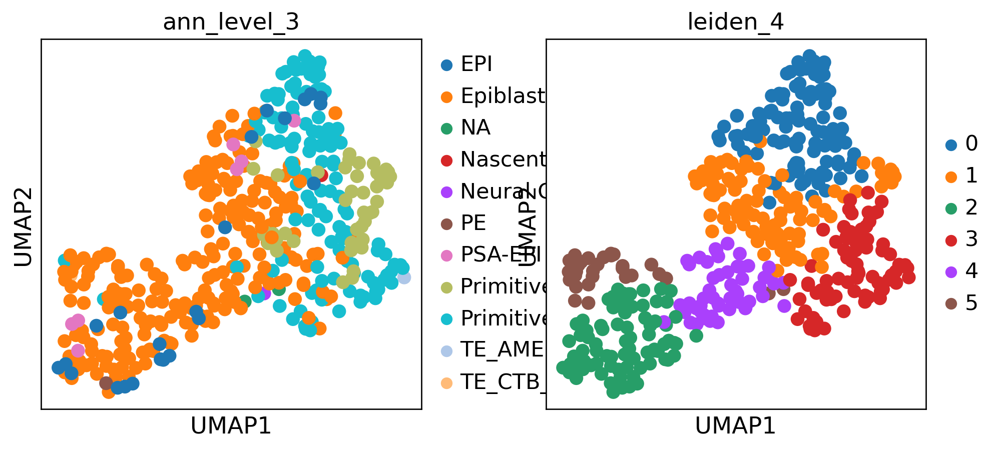

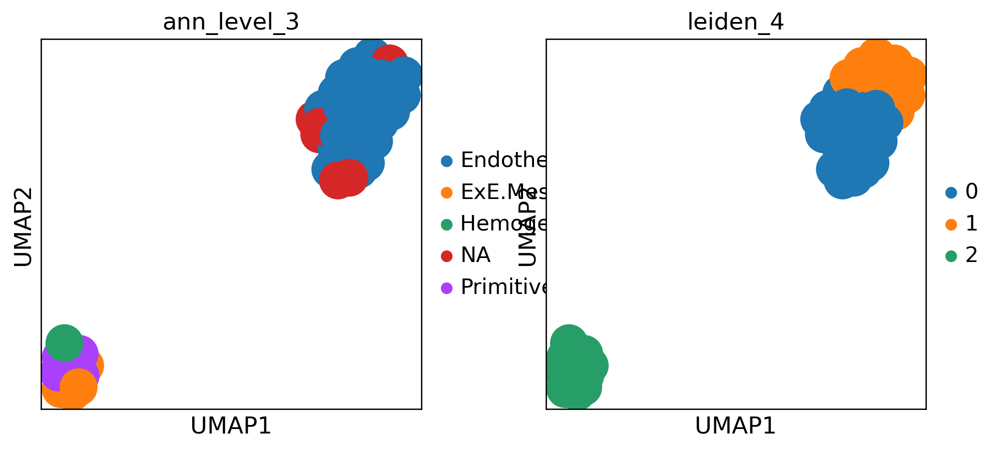

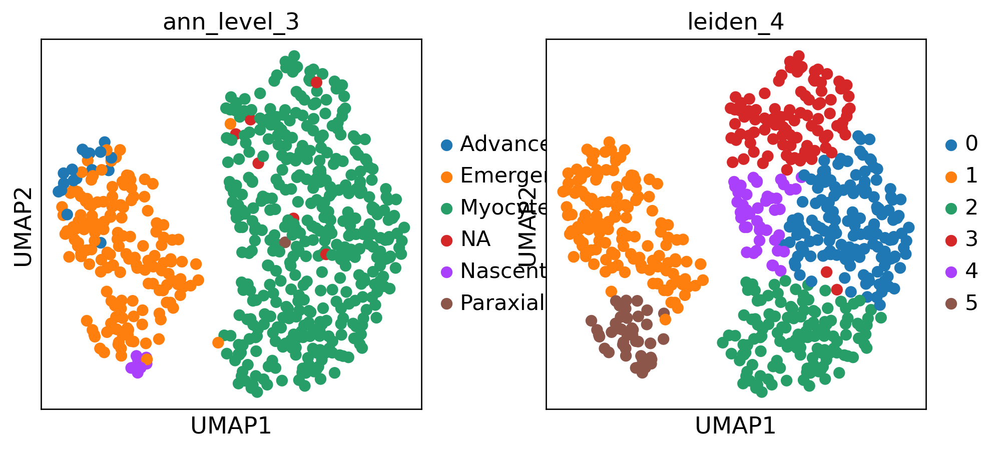

In [15]:
for cl_to_recluster in cls_to_recluster:
    subadata = adata[adata.obs.leiden_3 == cl_to_recluster, :].copy()
    sc.pp.neighbors(subadata, n_neighbors=10, use_rep="scANVI")
    sc.tl.umap(subadata)
    sc.tl.leiden(subadata, resolution=0.5, key_added="leiden_4")
    
    # Plot and check which cluster is which
    if cl_to_recluster == "0.1.0":
        sc.pl.umap(subadata, color=["ann_level_3", "leiden_4"])
        sc.pl.umap(subadata, color=["POU5F1", "DNMT3B", "NANOG", "NANOS3", "PDPN"], use_raw=False)
    
    elif cl_to_recluster == "0.6.1":
        sc.pl.umap(subadata, color=["ann_level_3", "leiden_4"])
        sc.pl.umap(subadata, color=["EPCAM", "SOX17", "GATA6"], use_raw=False)
    
    elif cl_to_recluster == "0.1.2":
        sc.pl.umap(subadata, color=["ann_level_3", "leiden_4"])
    
    elif cl_to_recluster == "0.9.1":
        sc.pl.umap(subadata, color=["ann_level_3", "leiden_4"])
    
    elif cl_to_recluster == "0.3.2":
        sc.pl.umap(subadata, color=["ann_level_3", "leiden_4"])
    
    # Add clustering info to main object
    if "leiden_4" not in adata.obs.columns:
        adata.obs["leiden_4"] = np.nan  # Initialize with NaN if not present

    # Update "leiden_4" for the relevant cells
    adata.obs.loc[subadata.obs.index, "leiden_4"] = [
        f"{l4}.{l5}" for l4, l5 in zip(subadata.obs.leiden_3, subadata.obs.leiden_4)
    ]

In [16]:
adata

AnnData object with n_obs × n_vars = 34387 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap', 'anno_colors', 'sub_anno_colors', 'leiden_3_colors'
    obsm: 'CCA', 'FastMNN', '

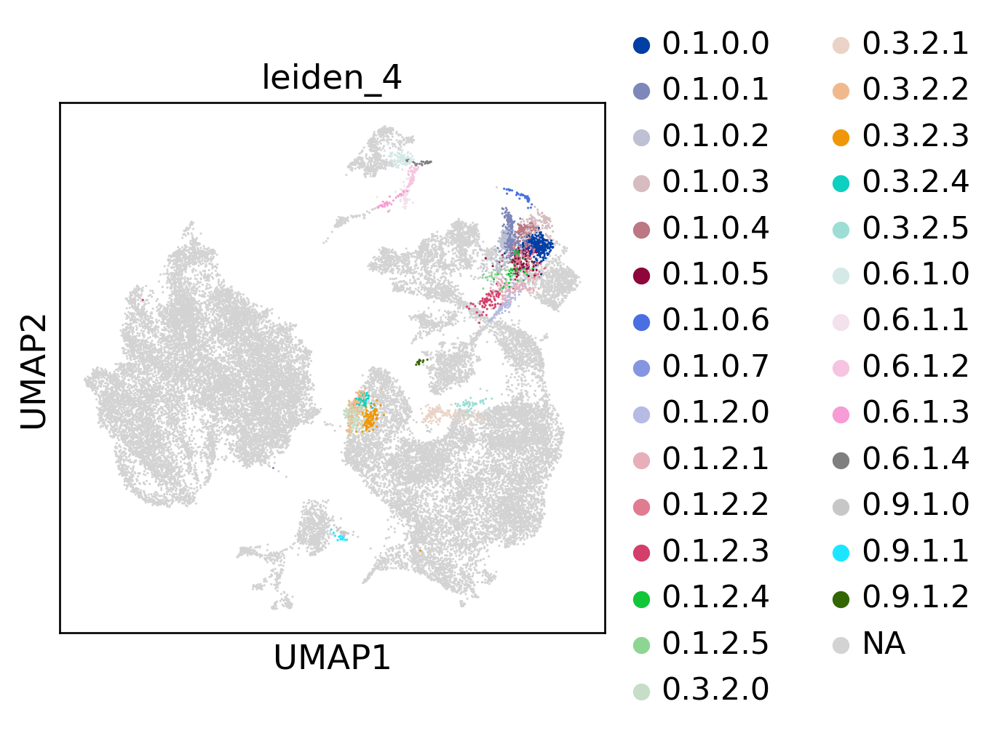

In [17]:
# plot
sc.pl.umap(adata, color="leiden_4")

In [18]:
#replace leiden3 "0.1.0" and  "0.6.1"  by leiden4
# Identify the clusters in leiden_3 that you want to replace
clusters_to_replace = ['0.1.0', '0.6.1', '0.1.2','0.9.1','0.3.2']  # replace with your cluster IDs

# Convert leiden_3 and leiden_4 to strings to avoid category mismatches
adata.obs['leiden_3'] = adata.obs['leiden_3'].astype(str)
adata.obs['leiden_4'] = adata.obs['leiden_4'].astype(str)

# Create a copy of leiden_3 to modify
new_leiden_3 = adata.obs['leiden_3'].copy()

# Replace the specified clusters with the subcluster information from leiden_4
for cluster in clusters_to_replace:
    mask = adata.obs['leiden_3'] == cluster
    new_leiden_3[mask] = adata.obs['leiden_4'][mask]

# Update the AnnData object with the new leiden_3 column
adata.obs['leiden_3'] = new_leiden_3

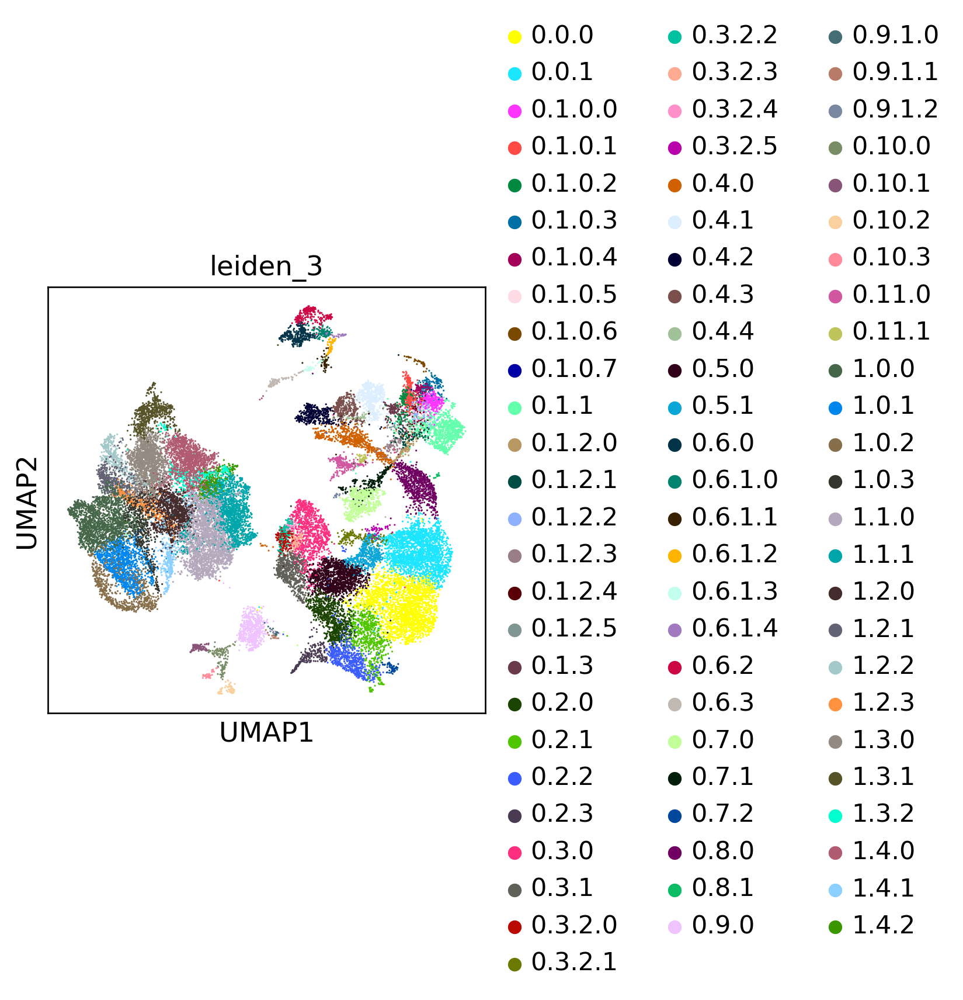

In [19]:
# plot
sc.pl.umap(adata, color="leiden_3")

In [20]:
# Filter out cells with doublet_score > 500
adata = adata[adata.obs['doublet_score'] <= 100].copy()
adata

AnnData object with n_obs × n_vars = 33599 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap', 'anno_colors', 'sub_anno_colors', 'leiden_3_colors'
    obsm: 'CCA', 'FastMNN', '

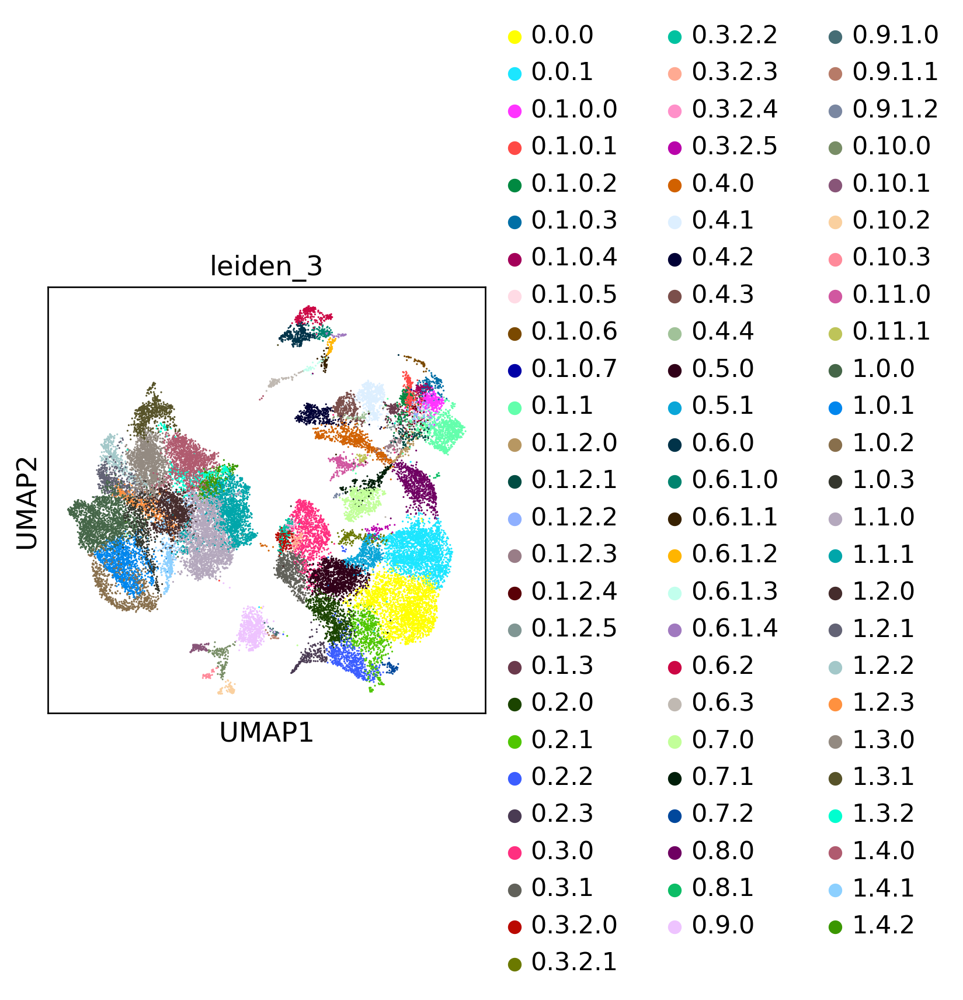

In [21]:
# plot
sc.pl.umap(adata, color="leiden_3")

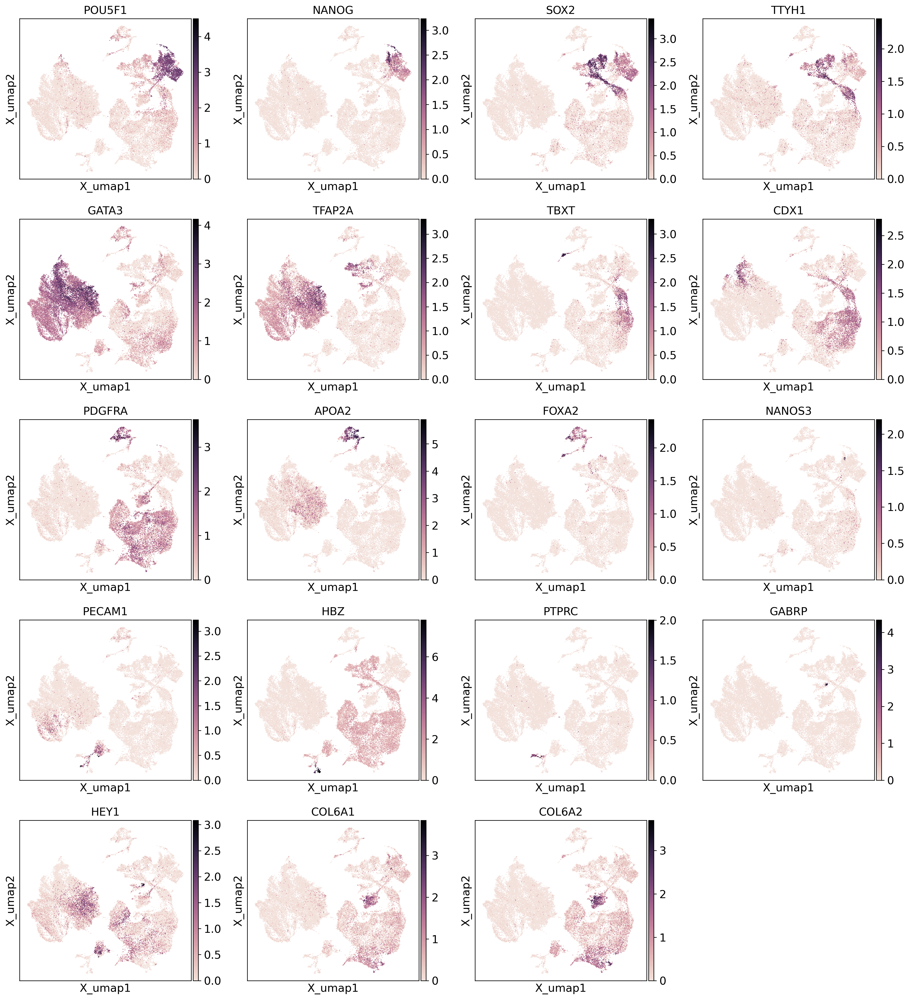

In [22]:
# Define the list of genes you want to plot
genes_to_plot = ["POU5F1","NANOG",#epiblast
                 "SOX2", "TTYH1", #Neural_ectoderm
                 "GATA3","TFAP2A",
                 "TBXT",  "CDX1","PDGFRA","APOA2","FOXA2","NANOS3",
                "PECAM1","HBZ","PTPRC",
                "GABRP","HEY1","COL6A1","COL6A2",]  # Replace "GENE2" and "GENE3" with the actual gene names

# Plot the UMAP embedding for the specified genes
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=genes_to_plot,
    use_raw=False,
    cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True)
)

In [23]:
##save dataset
adata.raw.var.rename(columns={'_index': 'index'}, inplace=True)
adata.write_h5ad(filename="human_clustering.h5ad")